In [1]:
import os
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import scipy
import shutil
import os
import shutil
import datetime
import pickle

In [25]:

# Define the root folder where the subfolders containing the CSV files are located
root_folder = 'rnmp_data\DeepTraLog\TraceLogData\\all data'

# Define the folder where you want to move all the CSV files to
destination_folder = 'csv_data'

# Loop through all subfolders in the root folder
for foldername, subfolders, filenames in os.walk(root_folder):
    # Loop through all CSV files in each subfolder
    for filename in filenames:
        if filename.endswith('.csv'):
            # Get the full path of the CSV file
            csv_path = os.path.join(foldername, filename)
            # Get the current time
            timestamp = datetime.datetime.now().strftime("%Y-%m-%d-%H-%M-%S")
            # Rename the CSV file with a timestamp
            new_filename = f"{filename.split('.')[0]}_{timestamp}.csv"
            # Get the full path of the renamed file in the destination folder
            destination_path = os.path.join(destination_folder, new_filename)
            # Move the CSV file to the destination folder with the new name
            shutil.move(csv_path, destination_path)


In [3]:
# df=pd.read_csv('rnmp_data\\DeepTraLog\\all of F data\\ERROR_errorf0502_SpanData2021-08-10_13-53-38.csv')

In [17]:
df=pd.read_csv('rnmp_data\\DeepTraLog\\TraceLogData\\all data\F01-01\\SUCCESSF0101_SpanData2021-08-14_10-22-48.csv')

In [18]:
df

,StartTime,EndTime,URL,SpanType,Service,SpanId,TraceId,Peer,ParentSpan,Component,IsError
0,1628884697510,1628884701848,{GET}/api/v1/cancelservice/cancel/{orderId}/{l...,Entry,ts-cancel-service,a8ac2bc13e5c423d83743ee2d661482b.42.1628884697...,a8ac2bc13e5c423d83743ee2d661482b.42.1628884697...,ts-cancel-service,-1,SpringMVC,False
1,1628884697515,1628884697523,SpringAsync,Local,ts-cancel-service,a8ac2bc13e5c423d83743ee2d661482b.58.1628884697...,a8ac2bc13e5c423d83743ee2d661482b.42.1628884697...,ts-cancel-service,a8ac2bc13e5c423d83743ee2d661482b.42.1628884697...,SpringAsync,False
2,1628884697515,1628884697523,/api/v1/inside_pay_service/inside_payment/draw...,Exit,ts-cancel-service,a8ac2bc13e5c423d83743ee2d661482b.58.1628884697...,a8ac2bc13e5c423d83743ee2d661482b.42.1628884697...,ts-inside-payment-service,a8ac2bc13e5c423d83743ee2d661482b.58.1628884697...,SpringRestTemplate,False
3,1628884697518,1628884697524,{GET}/api/v1/inside_pay_service/inside_payment...,Entry,ts-inside-payment-service,e011366013074feda29701dc14e41305.44.1628884697...,a8ac2bc13e5c423d83743ee2d661482b.42.1628884697...,ts-inside-payment-service,a8ac2bc13e5c423d83743ee2d661482b.58.1628884697...,SpringMVC,False
4,1628884697520,1628884697520,MongoDB/FindOperation,Exit,ts-inside-payment-service,e011366013074feda29701dc14e41305.44.1628884697...,a8ac2bc13e5c423d83743ee2d661482b.42.1628884697...,ts-inside-payment-mongo,e011366013074feda29701dc14e41305.44.1628884697...,mongodb-driver,False
...,...,...,...,...,...,...,...,...,...,...,...
6461,1628884463204,1628884463208,/api/v1/userservice/users/id/4d2a46c7-71cb-4cf...,Exit,ts-cancel-service,a8ac2bc13e5c423d83743ee2d661482b.41.1628884459...,a8ac2bc13e5c423d83743ee2d661482b.41.1628884459...,ts-user-service,a8ac2bc13e5c423d83743ee2d661482b.41.1628884459...,SpringRestTemplate,False
6462,1628884463206,1628884463209,{GET}/api/v1/userservice/users/id/{userId},Entry,ts-user-service,9c0a0f29458041119609c3a58e6e44fa.46.1628884463...,a8ac2bc13e5c423d83743ee2d661482b.41.1628884459...,ts-user-service,a8ac2bc13e5c423d83743ee2d661482b.41.1628884459...,SpringMVC,False
6463,1628884463208,1628884463208,MongoDB/FindOperation,Exit,ts-user-service,9c0a0f29458041119609c3a58e6e44fa.46.1628884463...,a8ac2bc13e5c423d83743ee2d661482b.41.1628884459...,ts-user-mongo,9c0a0f29458041119609c3a58e6e44fa.46.1628884463...,mongodb-driver,False
6464,1628884463208,1628884463505,/api/v1/notifyservice/notification/order_cance...,Exit,ts-cancel-service,a8ac2bc13e5c423d83743ee2d661482b.41.1628884459...,a8ac2bc13e5c423d83743ee2d661482b.41.1628884459...,ts-notification-service,a8ac2bc13e5c423d83743ee2d661482b.41.1628884459...,SpringRestTemplate,False


In [2]:
class TraceNode:
    def __init__(self, start_time, end_time, url, span_type, service, span_id, trace_id, peer, parent_span, component, is_error):
        self.start_time = start_time
        self.end_time = end_time
        self.url = url
        self.span_type = span_type
        self.service = service
        self.span_id = span_id
        self.trace_id = trace_id
        self.peer = peer
        self.parent_span = parent_span
        self.component = component
        self.is_error = is_error
        
    def get_duration(self):
        duration = self.end_time - self.start_time
        return duration
    
    @staticmethod
    def from_list(lst):
        return TraceNode(*lst)
    
    def print_info(self):
        print(f"TraceNode(start_time={self.start_time}, end_time={self.end_time}, url='{self.url}', span_type='{self.span_type}', service='{self.service}', span_id='{self.span_id}', trace_id='{self.trace_id}', peer='{self.peer}', parent_span='{self.parent_span}', component='{self.component}', is_error={self.is_error})")
    

In [5]:
# df['Time']=df['EndTime']-df['StartTime']

In [9]:
def create_graph(parent, index,df):
    children=df.loc[df['ParentSpan']==parent.span_id].values.tolist()
    children=[TraceNode.from_list(el) for el in children]
    colors.append('blue')
    if len(children)==0:
        return None
    [G.add_edge(parent,element) for element in children]
    [create_graph(el, index+1,df) for el in children]

In [10]:
destination_folder = 'csv_data'
G=nx.MultiGraph()
j=60
for filename in os.listdir(destination_folder):
    j=j-1
    df2=pd.read_csv('csv_data\\'+filename)
    print(len(df2))
    if len(df2.columns)!=11:
        continue
    # G=nx.MultiGraph()
    color_map=[]
    colors=[]
    i=0
    print(f'FILENAME: {filename}, LEFT: {j}')
    parent_nodes = []
    for index, row in df2.iterrows():
        if row['ParentSpan']=='-1':
            colors=[]
            colors.append('red')
            i+=1
            par=TraceNode.from_list(row.tolist())
            parent_nodes.append(par)
            # G.add_edge(par, str(i))
            create_graph(par, 1,df2)
            color_map.extend(colors[:-1])

        # if i == 2: 
        #       break
        
# G.remove_node('1')
    

766
FILENAME: ERROR_errorf0502_SpanData2021-08-10_13-53-38_2023-04-17-12-40-49.csv, LEFT: 59
6850
FILENAME: ERROR_errorf0701_SpanData2021-08-10_14-09-59_2023-04-17-12-40-49.csv, LEFT: 58
6942
FILENAME: ERROR_errorf0702_SpanData2021-08-10_14-33-35_2023-04-17-12-40-49.csv, LEFT: 57
82800
FILENAME: ERROR_F012_SpanData2021-08-14_01-52-43.csv, LEFT: 56
109365
FILENAME: ERROR_SpanData.csv, LEFT: 55
1628
10316
FILENAME: ERROR_SpanData2021-07-29_13-58-37_2023-04-17-12-40-49.csv, LEFT: 53
604
FILENAME: ERROR_SpanData2021-07-29_19-15-36_2023-04-17-12-40-49.csv, LEFT: 52
5250
FILENAME: ERROR_SpanData2021-07-30_10-13-04_2023-04-17-12-40-49.csv, LEFT: 51
2000
FILENAME: ERROR_SpanData2021-07-30_11-00-30_2023-04-17-12-40-49.csv, LEFT: 50
744
FILENAME: ERROR_SpanData2021-07-30_12-07-36_2023-04-17-12-40-49.csv, LEFT: 49
597
FILENAME: ERROR_SpanData2021-07-30_14-20-15_2023-04-17-12-40-49.csv, LEFT: 48
3600
FILENAME: ERROR_SpanData2021-08-07_20-30-26_2023-04-17-12-40-49.csv, LEFT: 47
15300
FILENAME: ERRO

In [11]:
# # G=nx.MultiGraph()
# color_map=[]
# colors=[]
# i=0
# parent_nodes = []
# for index, row in df.iterrows():
#     if row['ParentSpan']=='-1':
#         colors=[]
#         colors.append('red')
#         i+=1
#         par=TraceNode.from_list(row.tolist())
#         parent_nodes.append(par)
#         # G.add_edge(par, str(i))
#         create_graph(par, 1)
#         color_map.extend(colors[:-1])

#     # if i == 2: 
#     #   break
        
# # G.remove_node('1')

len(G)

1750044

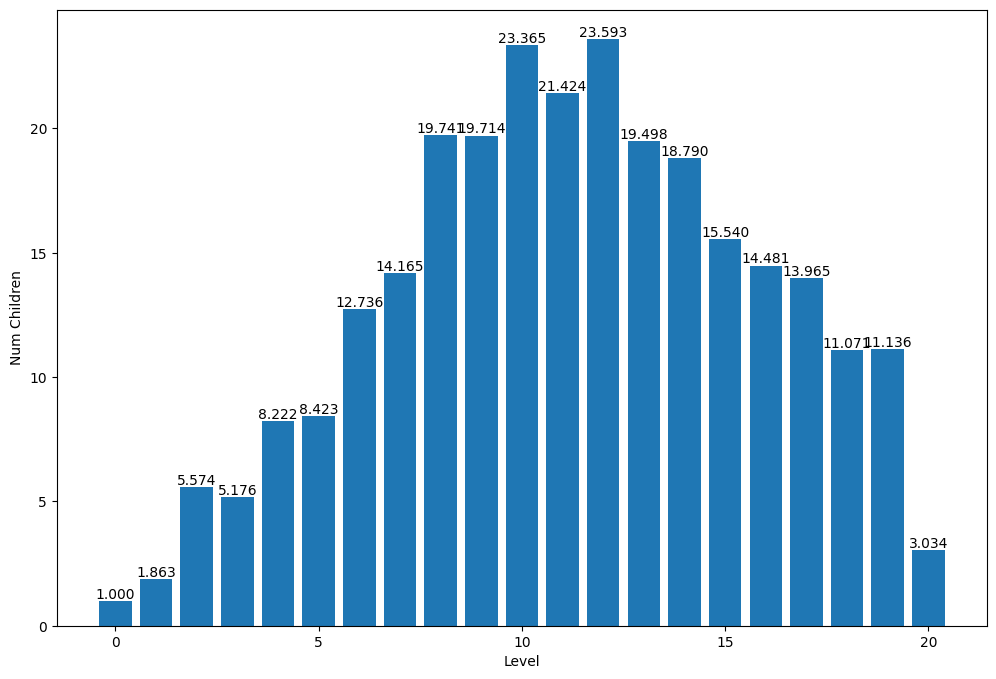

In [20]:
import networkx as nx
from networkx.algorithms.components import connected_components

def count_nodes_per_level(G):
    results = []
    for component in connected_components(G):
        levels = {}
        visited = set()
        if not component:
            results.append(levels)
            continue
        root = next(iter(component))
        current_level = [root]
        while current_level:
            next_level = []
            for node in current_level:
                if node not in visited:
                    visited.add(node)
                    level = nx.shortest_path_length(G, source=root, target=node)
                    if level not in levels:
                        levels[level] = 0
                    levels[level] += 1
                    next_level.extend(G.neighbors(node))
            current_level = next_level
        results.append(levels)
    return results


def average_dicts(dicts):
    avg_dict = {}
    count_dict = {}
    for d in dicts:
        for key, value in d.items():
            if key not in avg_dict:
                avg_dict[key] = 0
                count_dict[key] = 0
            avg_dict[key] += value
            count_dict[key] += 1
    for key in avg_dict:
        avg_dict[key] /= count_dict[key]
        avg_dict[key] = round(avg_dict[key], 3)
    return avg_dict



avgs=average_dicts(count_nodes_per_level(G))


fig = plt.figure(figsize=(12, 8))
plt.bar(avgs.keys(), avgs.values())
# plt.title('')
plt.xlabel('Level')
plt.ylabel('Num Children')
for key, value in avgs.items():
    plt.text(key, value + 0.1, f'{value:.3f}', ha='center')
plt.show()

In [13]:

# with open('multigraph.pkl', 'wb') as f:
#     pickle.dump(G, f)

In [14]:
with open('multigraph.pkl', 'rb') as f:
    G_loaded = pickle.load(f)

In [15]:
len(G_loaded)

1750044

In [46]:
count_nodes_per_level(G)

[{0: 1, 1: 2, 2: 4, 3: 4, 4: 4, 5: 4},
 {0: 1, 1: 2, 2: 5, 3: 6, 4: 3, 5: 2},
 {0: 1, 1: 3, 2: 1, 3: 1, 4: 4, 5: 4, 6: 3, 7: 2},
 {0: 1, 1: 2, 2: 3, 3: 4, 4: 4, 5: 3, 6: 2},
 {0: 1, 1: 2, 2: 3, 3: 4, 4: 4, 5: 3, 6: 2},
 {0: 1, 1: 2, 2: 5, 3: 4, 4: 3, 5: 4},
 {0: 1, 1: 2, 2: 4, 3: 4, 4: 4, 5: 4},
 {0: 1, 1: 1, 2: 1, 3: 1, 4: 4, 5: 4, 6: 3, 7: 4},
 {0: 1, 1: 2, 2: 5, 3: 6, 4: 3, 5: 2},
 {0: 1, 1: 1, 2: 2, 3: 1, 4: 1, 5: 4, 6: 4, 7: 3, 8: 2},
 {0: 1, 1: 1, 2: 2, 3: 1, 4: 1, 5: 4, 6: 4, 7: 3, 8: 2},
 {0: 1, 1: 2, 2: 1, 3: 4, 4: 4, 5: 3, 6: 4},
 {0: 1, 1: 2, 2: 5, 3: 6, 4: 3, 5: 2},
 {0: 1, 1: 1, 2: 1, 3: 4, 4: 4, 5: 4, 6: 4},
 {0: 1, 1: 1, 2: 2, 3: 1, 4: 1, 5: 4, 6: 4, 7: 3, 8: 2},
 {0: 1, 1: 2, 2: 1, 3: 4, 4: 4, 5: 3, 6: 4},
 {0: 1, 1: 2, 2: 5, 3: 4, 4: 3, 5: 4},
 {0: 1, 1: 2, 2: 3, 3: 4, 4: 4, 5: 3, 6: 2},
 {0: 1, 1: 2, 2: 4, 3: 4, 4: 4, 5: 4},
 {0: 1, 1: 3, 2: 1, 3: 1, 4: 4, 5: 4, 6: 3, 7: 2},
 {0: 1, 1: 2, 2: 5, 3: 6, 4: 3, 5: 2},
 {0: 1, 1: 3, 2: 1, 3: 1, 4: 4, 5: 4, 6: 3, 7: 2},
 {0:

In [147]:
avgs=average_dicts(count_nodes_per_level(G))
avgs

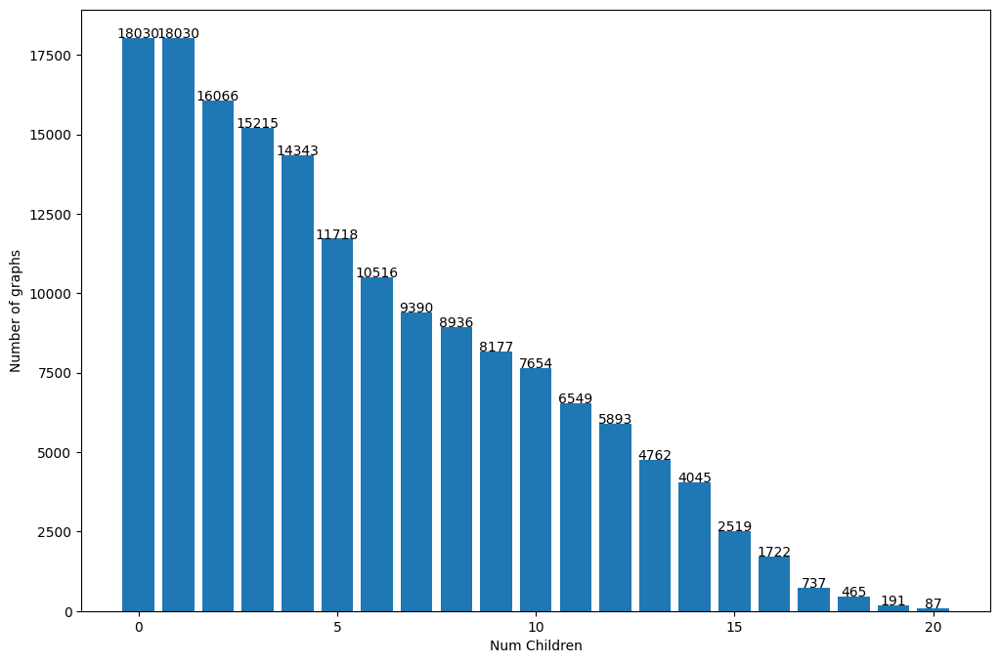

In [22]:
from collections import Counter
key_counts = Counter(key for d in count_nodes_per_level(G) for key in d)
fig = plt.figure(figsize=(12, 8))
plt.bar(key_counts.keys(), key_counts.values())
# plt.title('')
plt.xlabel('Num Children')
plt.ylabel('Number of graphs')
for key, value in key_counts.items():
    plt.text(key, value + 0.1, f'{value:d}', ha='center')
plt.show()

In [112]:
def count_children(G):
    children_count = {}
    i=0
    for node in G.nodes():
        children_count[f"Level {i}"] = len(list(G.neighbors(node)))
        i+=1
    return children_count

In [110]:
def count_children(G):
    children_counts = []
    for component in nx.connected_components(G):
        component_counts = {}
        i = 0
        for node in component:
            component_counts[f"Level {i}"] = len(list(G.neighbors(node)))
            i += 1
        children_counts.append(component_counts)
    if len(children_counts) == 1:
        return children_counts[0]
    else:
        return children_counts

In [113]:
children_count = count_children(G)
children_count

{'Level 0': 5,
 'Level 1': 2,
 'Level 2': 2,
 'Level 3': 2,
 'Level 4': 2,
 'Level 5': 2,
 'Level 6': 2,
 'Level 7': 3,
 'Level 8': 1,
 'Level 9': 1,
 'Level 10': 2,
 'Level 11': 3,
 'Level 12': 1,
 'Level 13': 1,
 'Level 14': 2,
 'Level 15': 1,
 'Level 16': 2,
 'Level 17': 1,
 'Level 18': 1,
 'Level 19': 5,
 'Level 20': 2,
 'Level 21': 2,
 'Level 22': 2,
 'Level 23': 2,
 'Level 24': 2,
 'Level 25': 2,
 'Level 26': 3,
 'Level 27': 1,
 'Level 28': 1,
 'Level 29': 2,
 'Level 30': 1,
 'Level 31': 2,
 'Level 32': 1,
 'Level 33': 1,
 'Level 34': 2,
 'Level 35': 3,
 'Level 36': 1,
 'Level 37': 1}

In [55]:
G.degree()

MultiDegreeView({<__main__.TraceNode object at 0x000001C8B8F12200>: 5, <__main__.TraceNode object at 0x000001C8B8F12D10>: 2, <__main__.TraceNode object at 0x000001C8B8F120B0>: 2, <__main__.TraceNode object at 0x000001C8B8F13190>: 2, <__main__.TraceNode object at 0x000001C8B8F12BF0>: 2, <__main__.TraceNode object at 0x000001C8B8F13010>: 2, <__main__.TraceNode object at 0x000001C8B8F12E00>: 2, <__main__.TraceNode object at 0x000001C8B8F12110>: 3, <__main__.TraceNode object at 0x000001C8B8F12980>: 1, <__main__.TraceNode object at 0x000001C8B8F122F0>: 1, <__main__.TraceNode object at 0x000001C8B8F12680>: 2, <__main__.TraceNode object at 0x000001C8B8F12530>: 3, <__main__.TraceNode object at 0x000001C8B8F12860>: 1, <__main__.TraceNode object at 0x000001C8B8F128F0>: 1, <__main__.TraceNode object at 0x000001C8B8F130A0>: 2, <__main__.TraceNode object at 0x000001C8B8F11810>: 1, <__main__.TraceNode object at 0x000001C8B8F12740>: 2, <__main__.TraceNode object at 0x000001C8B8F12C80>: 1, <__main__.T

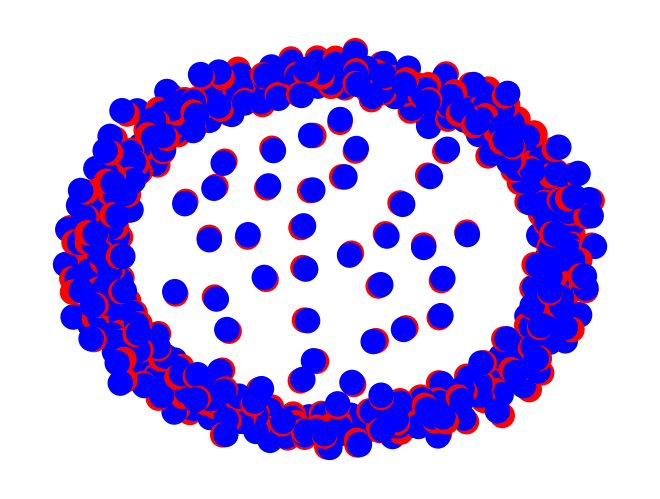

In [15]:
nx.draw(G,node_color=color_map)
# nx.draw(G)

In [125]:
# import os
# import glob

# # Get all CSV files in the folder
# csv_files = glob.glob(os.path.join("C:\\Users\\38976\Desktop\\AIOPS\\rnmp_data\DeepTraLog\\all of F data", "*.csv"))

# # Combine all CSV files into one DataFrame
# combined_df = pd.concat([pd.read_csv(f) for f in csv_files])

# # Write the combined DataFrame to a new CSV file
# combined_df.to_csv("concatinated_F_data.csv", index=False)

In [9]:
import matplotlib.pyplot as plt
import networkx as nx
from networkx.drawing.nx_pydot import graphviz_layout
import pydot

In [10]:

def draw(start_node):
  T = nx.bfs_tree(G, start_node)
  pos = graphviz_layout(T, prog="dot")
  node_colors = ["red" if node == start_node else "blue" for node in T.nodes()]
  nx.draw(T, pos, node_color=node_colors)
  plt.show()


In [11]:
draw(parent_nodes[1])

C:\Users\38976\AppData\Local\Temp\ipykernel_2716\1730128544.py:3: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  pos = graphviz_layout(T, prog="dot")


FileNotFoundError: [WinError 2] "dot" not found in path.

In [23]:
alldf=pd.read_csv('concatinated_F_data.csv')

C:\Users\38976\AppData\Local\Temp\ipykernel_12952\2602991717.py:1: DtypeWarning: Columns (2,3,4,5,6,7,8,9,10,12,13,14,15,16,17,18,19,20,21) have mixed types. Specify dtype option on import or set low_memory=False.
  alldf=pd.read_csv('concatinated_F_data.csv')


In [24]:
alldf = alldf.iloc[:, :11]


In [25]:
alldf.dropna(inplace=True)

In [26]:
alldf['IsError']

,StartTime,EndTime,URL,SpanType,Service,SpanId,TraceId,Peer,ParentSpan,Component,IsError
0,1.628574e+12,1.628574e+12,{POST}/api/v1/travelservice/trips/left,Entry,ts-travel-service,28ed71db936d43bcaa80edc27897aa98.38.1628574475...,28ed71db936d43bcaa80edc27897aa98.38.1628574475...,ts-travel-service,-1,SpringMVC,True
1,1.628574e+12,1.628574e+12,/api/v1/ticketinfoservice/ticketinfo/Shang Hai,Exit,ts-travel-service,28ed71db936d43bcaa80edc27897aa98.38.1628574475...,28ed71db936d43bcaa80edc27897aa98.38.1628574475...,ts-ticketinfo-service,28ed71db936d43bcaa80edc27897aa98.38.1628574475...,SpringRestTemplate,True
2,1.628575e+12,1.628575e+12,{POST}/api/v1/travelservice/trips/left,Entry,ts-travel-service,28ed71db936d43bcaa80edc27897aa98.41.1628574529...,28ed71db936d43bcaa80edc27897aa98.41.1628574529...,ts-travel-service,-1,SpringMVC,True
3,1.628575e+12,1.628575e+12,/api/v1/ticketinfoservice/ticketinfo/Shang Hai,Exit,ts-travel-service,28ed71db936d43bcaa80edc27897aa98.41.1628574529...,28ed71db936d43bcaa80edc27897aa98.41.1628574529...,ts-ticketinfo-service,28ed71db936d43bcaa80edc27897aa98.41.1628574529...,SpringRestTemplate,True
4,1.628574e+12,1.628574e+12,{POST}/api/v1/travelservice/trips/left,Entry,ts-travel-service,28ed71db936d43bcaa80edc27897aa98.46.1628574432...,28ed71db936d43bcaa80edc27897aa98.46.1628574432...,ts-travel-service,-1,SpringMVC,True
...,...,...,...,...,...,...,...,...,...,...,...
1576760,1.628759e+12,1.628759e+12,{GET}/api/v1/stationservice/stations/id/{stati...,Entry,ts-station-service,238d36fe8e164aa88b01b4e478b0bd18.45.1628759012...,ed526dddcb494522bc76e757203f90ee.44.1628759012...,ts-station-service,97ba85c0620947d2a0d6304c6504b388.35.1628759012...,SpringMVC,False
1576761,1.628759e+12,1.628759e+12,MongoDB/FindOperation,Exit,ts-station-service,238d36fe8e164aa88b01b4e478b0bd18.45.1628759012...,ed526dddcb494522bc76e757203f90ee.44.1628759012...,ts-station-mongo,238d36fe8e164aa88b01b4e478b0bd18.45.1628759012...,mongodb-driver,False
1576762,1.628759e+12,1.628759e+12,MongoDB/FindOperation,Exit,ts-travel-service,ed526dddcb494522bc76e757203f90ee.44.1628759012...,ed526dddcb494522bc76e757203f90ee.44.1628759012...,ts-travel-mongo,ed526dddcb494522bc76e757203f90ee.44.1628759012...,mongodb-driver,False
1576763,1.628759e+12,1.628759e+12,/api/v1/routeservice/routes/92708982-77af-4318...,Exit,ts-travel-service,ed526dddcb494522bc76e757203f90ee.44.1628759012...,ed526dddcb494522bc76e757203f90ee.44.1628759012...,ts-route-service,ed526dddcb494522bc76e757203f90ee.44.1628759012...,SpringRestTemplate,True


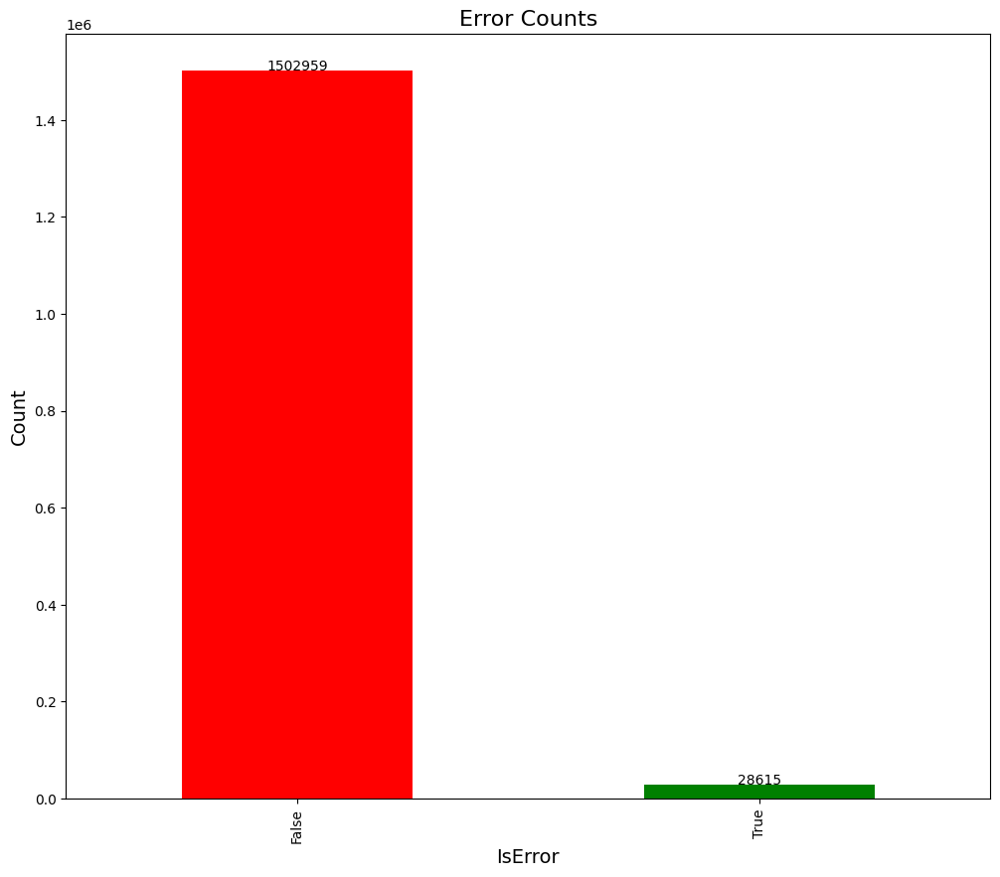

In [30]:
fig = plt.figure(figsize=(12, 10))

# Plot the bar chart
ax = alldf['IsError'].value_counts().plot(kind='bar', color=['red', 'green'])

# Add labels above each bar with the corresponding value
for i, v in enumerate(alldf['IsError'].value_counts()):
    ax.text(i, v + 0.1, f'{v}', ha='center')

# Set the x-axis and y-axis labels
ax.set_xlabel('IsError', fontsize=14)
ax.set_ylabel('Count', fontsize=14)

# Set the title of the plot
ax.set_title('Error Counts', fontsize=16)

# Show the plot
plt.show()

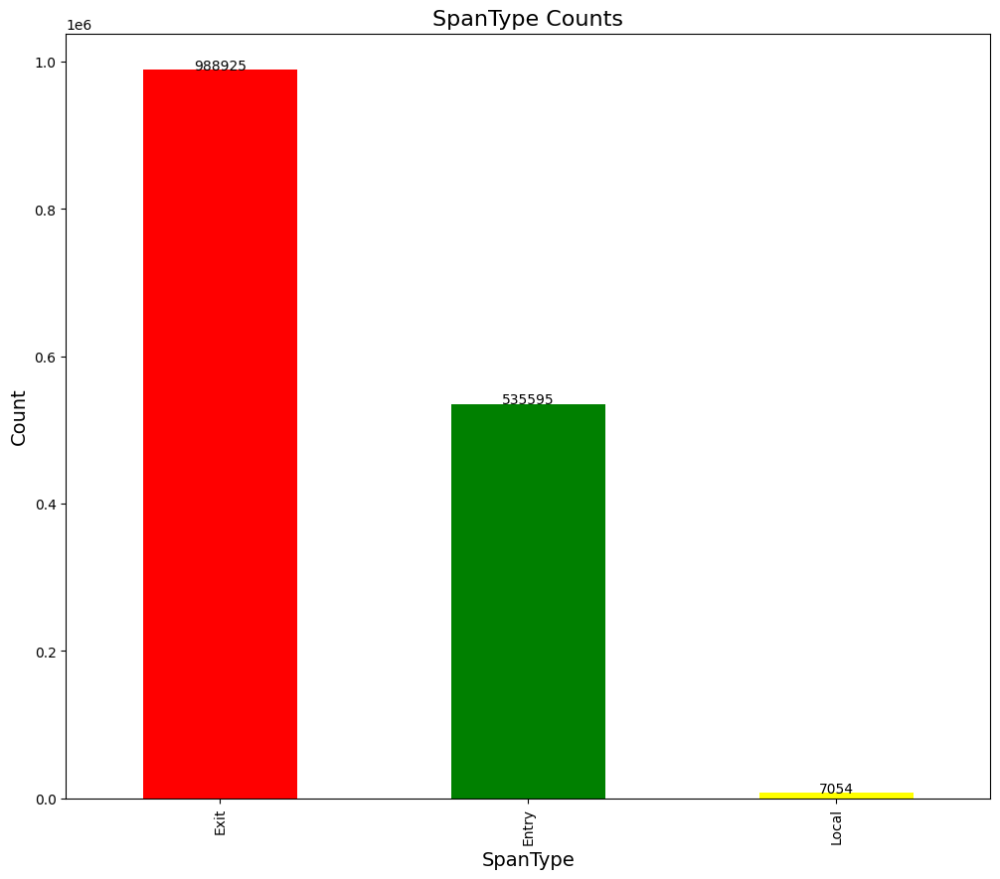

In [35]:
fig = plt.figure(figsize=(12, 10))

# Plot the bar chart
ax = alldf['SpanType'].value_counts().plot(kind='bar', color=['red', 'green','yellow'])

# Add labels above each bar with the corresponding value
for i, v in enumerate(alldf['SpanType'].value_counts()):
    ax.text(i, v + 0.1, f'{v}', ha='center')

# Set the x-axis and y-axis labels
ax.set_xlabel('SpanType', fontsize=14)
ax.set_ylabel('Count', fontsize=14)

# Set the title of the plot
ax.set_title('SpanType Counts', fontsize=16)

# Show the plot
plt.show()

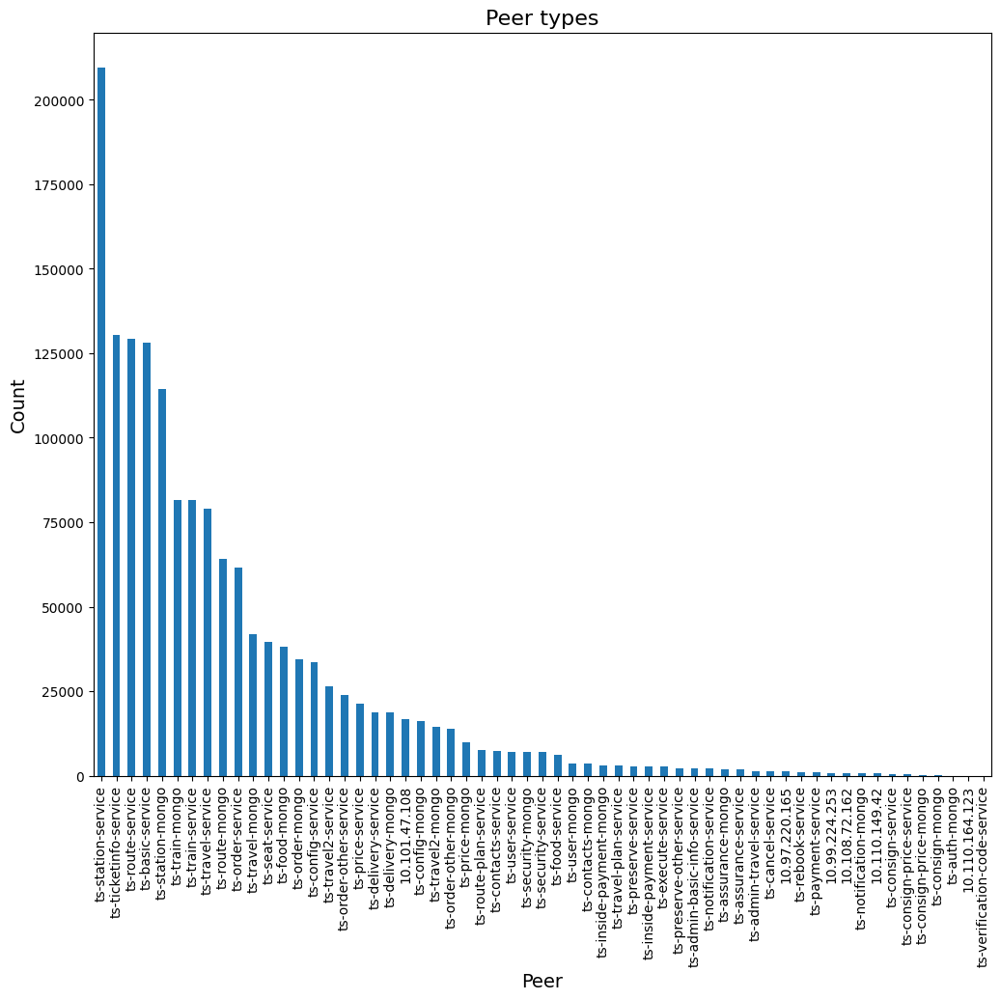

In [33]:


# Create a new figure with the specified size
fig = plt.figure(figsize=(12, 10))

# Plot the bar chart
ax = alldf['Peer'].value_counts().plot(kind='bar')

# Set the x-axis and y-axis labels
ax.set_xlabel('Peer', fontsize=14)
ax.set_ylabel('Count', fontsize=14)

# Set the title of the plot
ax.set_title('Peer types', fontsize=16)

# Show the plot
plt.show()


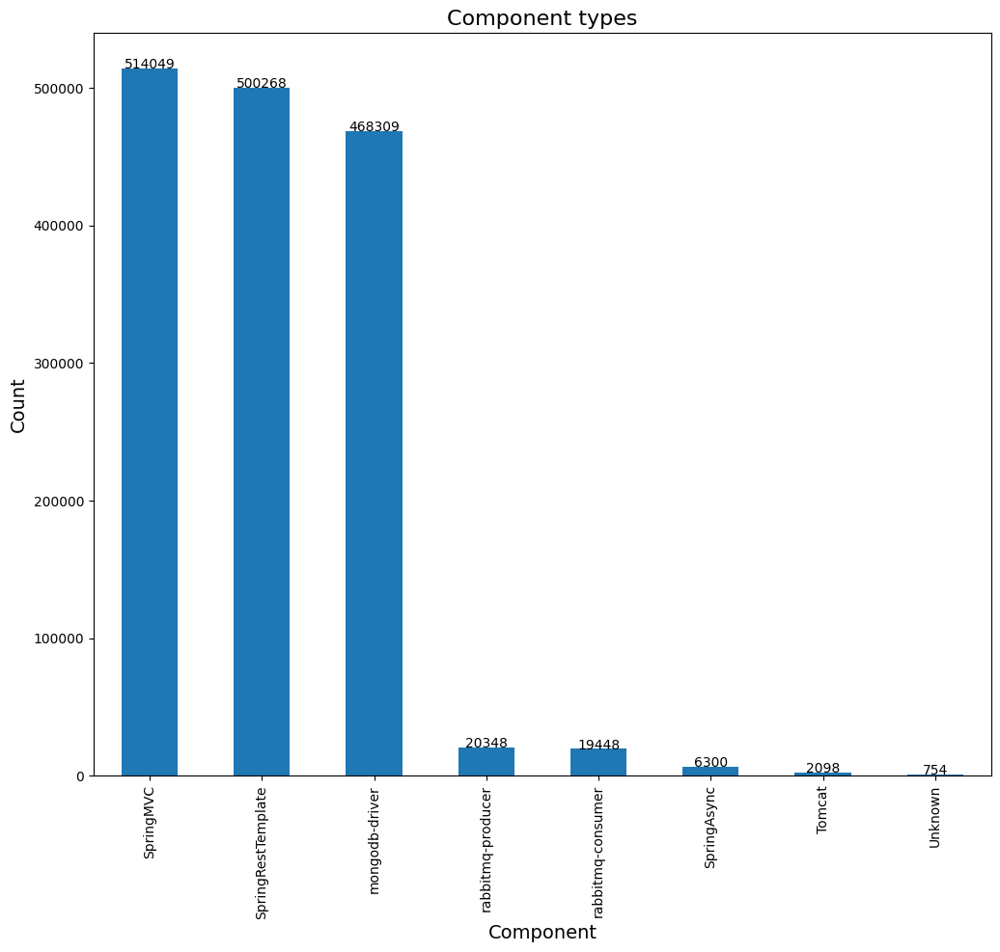

In [32]:
fig = plt.figure(figsize=(12, 10))

# Plot the bar chart
ax = alldf['Component'].value_counts().plot(kind='bar')

# Add labels above each bar with the corresponding value
for i, v in enumerate(alldf['Component'].value_counts()):
    ax.text(i, v + 0.1, f'{v}', ha='center')

# Set the x-axis and y-axis labels
ax.set_xlabel('Component', fontsize=14)
ax.set_ylabel('Count', fontsize=14)

# Set the title of the plot
ax.set_title('Component types', fontsize=16)

# Show the plot
plt.show()